In [26]:
crime_sf=read.csv('sanfrancisco_incidents_summer_2014.csv')
crime_sea=read.csv('seattle_incidents_summer_2014.csv')


library(ggplot2)
library(rgdal)
library(scales)
library(ggmap)
library(dplyr)
library(Cairo)
library(maptools)
library(stringr)
library(Rmisc)
library(car)

if (!require(gpclib)) install.packages("gpclib", type="source")
gpclibPermit()

Warning message:
In gpclibPermit(): support for gpclib will be withdrawn from maptools at the next major release

[1] TRUE

In [5]:
#number of different summary offense codes
print(length(levels(crime_sea$Summary.Offense.Code))) #26
print(table(crime_sea$Summary.Offense.Code))

#2300(theft) has most incidents at 8388


#number of different offense codes
length(levels(crime_sea$Offense.Code))
# 92

#number of different offense types
length(levels(crime_sea$Offense.Type)) #147

[1] 26

 1200  1300  2200  2299  2300  2400  2500  2600  2699  2700  2800  2900  3500 
  736  2639  3212   388 12161  2871   230  1475    96    57    67  2365   281 
 3700  3800  4000  4100  4800  4900  5000  5200  5300  5400  5700   900     X 
    3     7   202    48    61    11  1111   144   529   286   486     8  3305 


[1] 92

[1] 147

In [8]:
crime_sea$offense_category=sapply(crime_sea$Offense.Type, function(x) {
  if (grepl('-',x)){
    substring(x,1,regexpr("-",x)[1]-1)}
  else
    levels(x)[x]
})
table(crime_sea$offense_category)
most_frequent12=names(sort(table(crime_sea$offense_category),decreasing = TRUE)[1:12])


                  ANIMAL                    ASSLT            BIAS INCIDENT 
                      96                     1996                       20 
                BURGLARY              COUNTERFEIT       DISORDERLY CONDUCT 
                    3600                      159                        2 
                 DISPUTE              DISTURBANCE                    DRIVE 
                     171                     1333                       15 
                     DUI                  ELUDING                 EMBEZZLE 
                      34                        8                       57 
            ENDANGERMENT                   ESCAPE             FALSE REPORT 
                       7                        3                       23 
                FIREWORK                  FORGERY                    FRAUD 
                       9                       59                     1473 
              HARASSMENT                 HOMICIDE          ILLEGAL DUMPING 
           

In [10]:
most_frequent12

[1] "THEFT"           "BURGLARY"        "VEH"             "PROPERTY DAMAGE"
 [5] "ASSLT"           "FRAUD"           "DISTURBANCE"     "PROPERTY FOUND" 
 [9] "WARRARR"         "ROBBERY"         "THREATS"         "HARASSMENT"

In [12]:
#parse dates
reported=as.POSIXlt(crime_sea$Date.Reported,format = "%m/%d/%Y %H:%M:%S %p")
started=as.POSIXlt(crime_sea$Occurred.Date.or.Date.Range.Start,format = "%m/%d/%Y %I:%M:%S %p")
crime_sea$started_hr=started$hour
crime_sea$started_wday=started$wday
crime_sea$started_mday=started$mday

ended=as.POSIXlt(crime_sea$Occurred.Date.Range.End,format = "%m/%d/%Y %I:%M:%S %p")
#16280 NA's
crime_sea$ended_hr=ended$hour
crime_sea$ended_wday=ended$wday
crime_sea$ended_mday=ended$mday

In [22]:
crime_sea_cat_plot=crime_sea[crime_sea$offense_category%in%most_frequent12,]
crime_sea_cat_plot=crime_sea_cat_plot[crime_sea_cat_plot$District.Sector!='99' & crime_sea_cat_plot$District.Sector!='',]
start_p=ggplot(crime_sea_cat_plot,aes(x=started_hr,fill=offense_category))+
  geom_bar()+
  scale_x_continuous(breaks=0:23)
ggsave(start_p, file = "crime_start.png", width = 7, height = 4.5)

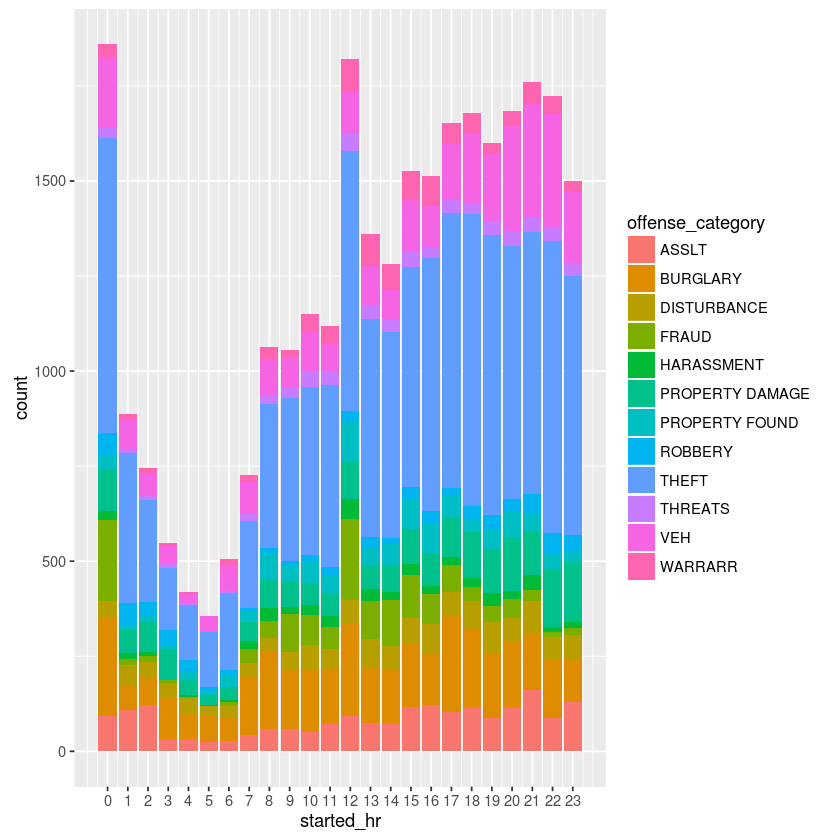

In [14]:
start_p

In [23]:
end_p=ggplot(crime_sea_cat_plot,aes(x=ended_hr, fill=offense_category))+
  geom_bar()+
  scale_x_continuous(breaks=0:23)
ggsave(end_p, file = "crime_end.png", width = 7, height = 4.5)

Warning message:
: Removed 13719 rows containing non-finite values (stat_count).

Warning message:
: Removed 13719 rows containing non-finite values (stat_count).

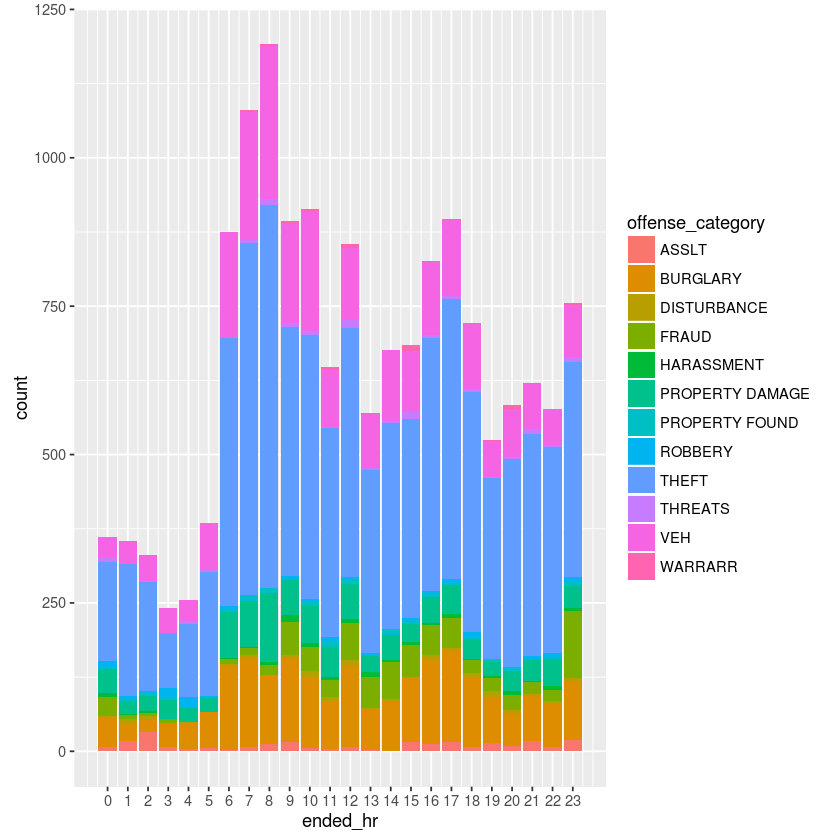

In [16]:
end_p

In [24]:
offense_time_by_district=ggplot(crime_sea_cat_plot,aes(x=started_hr,fill=offense_category))+
  geom_bar()+
  scale_x_continuous(breaks=0:23)+
  facet_wrap(~District.Sector, ncol = 3)+
  theme(axis.text.x = element_text(angle = 90, vjust=0.5))
  
ggsave(offense_time_by_district, file = "time_v_district.png", width = 7, height = 4.5)

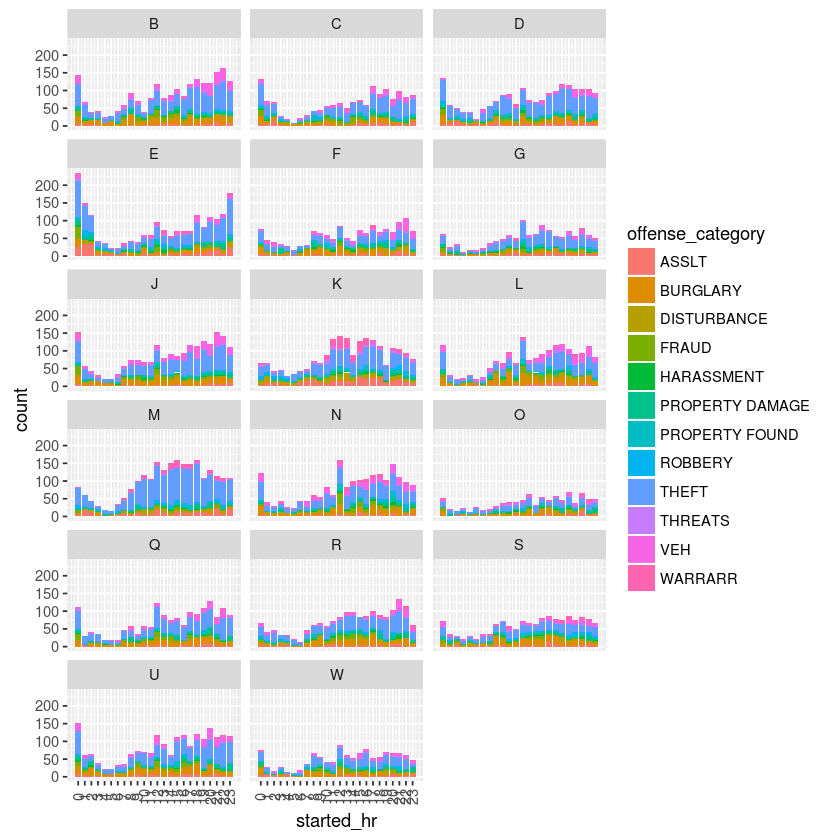

In [18]:
offense_time_by_district

In [25]:
crime_sea_map_plot=crime_sea[crime_sea$Latitude!=0 &crime_sea$Longitude!=0,]
district_crime=ggplot(crime_sea_map_plot, aes(x=Longitude, y=Latitude, color=District.Sector))+geom_jitter()
ggsave(district_crime, file = "district_crime.png", width = 7, height = 8)

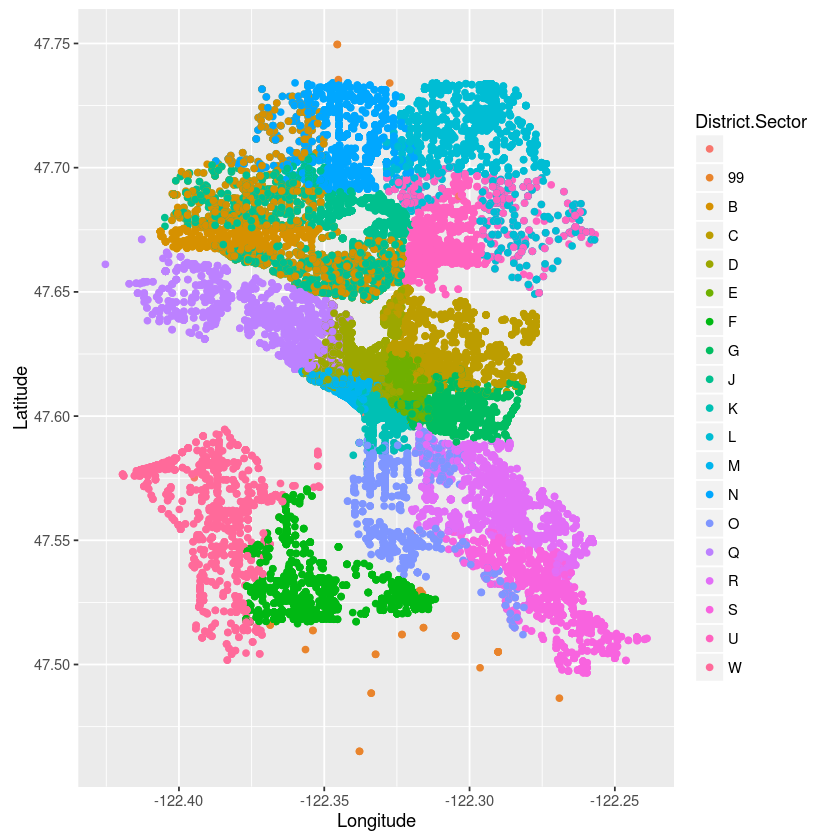

In [21]:
district_crime

In [28]:
crime_sea_cat_plot$started_wday=recode(crime_sea_cat_plot$started_wday,"0='Sunday'; 1='Monday'; 2='Tuesday'; 3='Wednesday'; 4='Thursday'; 5='Friday'; 6='Saturday'")
weekly=ggplot(crime_sea_cat_plot,aes(x=started_hr,fill=offense_category))+
  geom_bar()+
  scale_x_continuous(breaks=0:23)+
  facet_wrap(~started_wday, ncol = 7)+
  theme(axis.text.x = element_text(angle = 90, vjust=0.5))
  
ggsave(offense_time_by_district, file = "time_v_day.png", width = 7, height = 4.5)

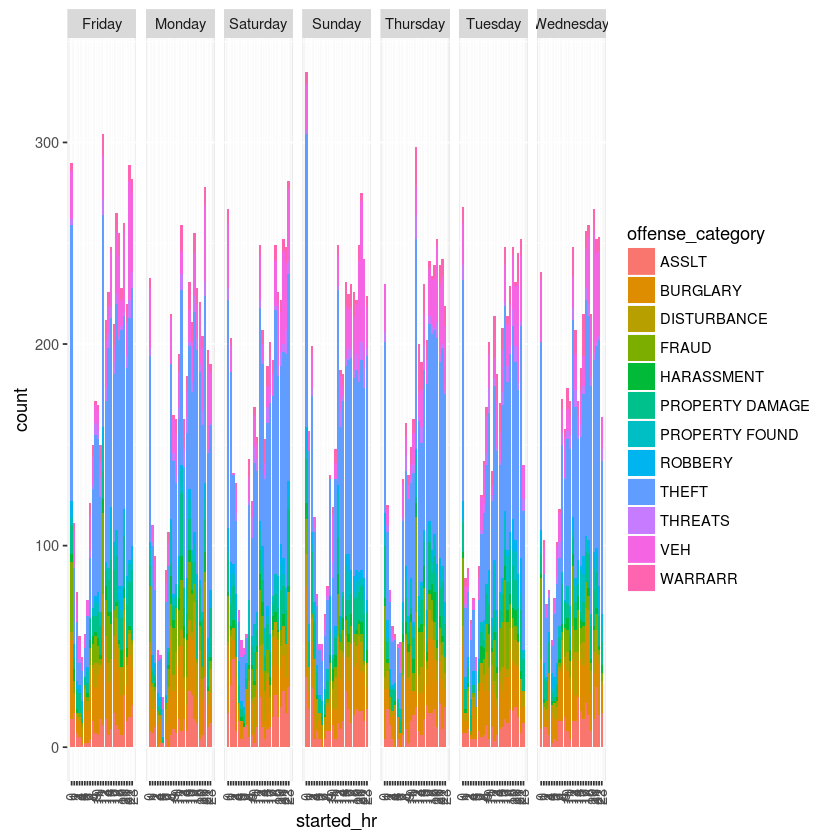

In [29]:
weekly